# Road Casualty Statistics Analysis

This notebook analyzes road casualty statistics from two datasets:
1. DFT Road Casualty Statistics
2. Unfallorte (Accident Locations) Data

We'll explore the data, create visualizations, and identify patterns and trends in road accidents.

## 1. Load and Examine Datasets

First, we'll import the necessary libraries and load our datasets.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Set display options
pd.set_option('display.max_columns', None)

# Load the datasets with correct paths and delimiter
uk_path = '../data/raw/dft-road-casualty-statistics-collision-2024.csv'
de_path = '../data/raw/Unfallorte2024_LinRef.csv'

dft_data = pd.read_csv(uk_path)
accident_locations = pd.read_csv(de_path, delimiter=';')

# Display basic information about both datasets
def print_overview(df, name):
    print(f"{name}:")
    print("Shape:", df.shape)
    print("\nColumns:", df.columns.tolist())
    print("\nData Types:\n", df.dtypes)
    print("\nMissing Values:\n", df.isnull().sum())
    print("\n" + "="*80 + "\n")

print_overview(dft_data, "DFT Road Casualty Statistics")
print_overview(accident_locations, "Accident Locations Data")

C:\Users\HP\AppData\Local\Temp\ipykernel_17148\2773760512.py:15: DtypeWarning: Columns (0,2,39) have mixed types. Specify dtype option on import or set low_memory=False.
  dft_data = pd.read_csv(uk_path)


DFT Road Casualty Statistics:
Shape: (100927, 44)

Columns: ['collision_index', 'collision_year', 'collision_ref_no', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'collision_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'local_authority_highway_current', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail_historic', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control_historic', 'pedestrian_crossing_physical_facilities_historic', 'pedestrian_crossing', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards_historic', 'carriageway_hazards', 'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'lsoa_of_accident_location

C:\Users\HP\AppData\Local\Temp\ipykernel_17148\2773760512.py:16: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  accident_locations = pd.read_csv(de_path, delimiter=';')


## 2. Analyzing Accident Severity and Temporal Patterns

Let's create visualizations to understand:
1. Distribution of accident severity
2. Accidents by time of day
3. Accidents by day of week
4. Monthly trends

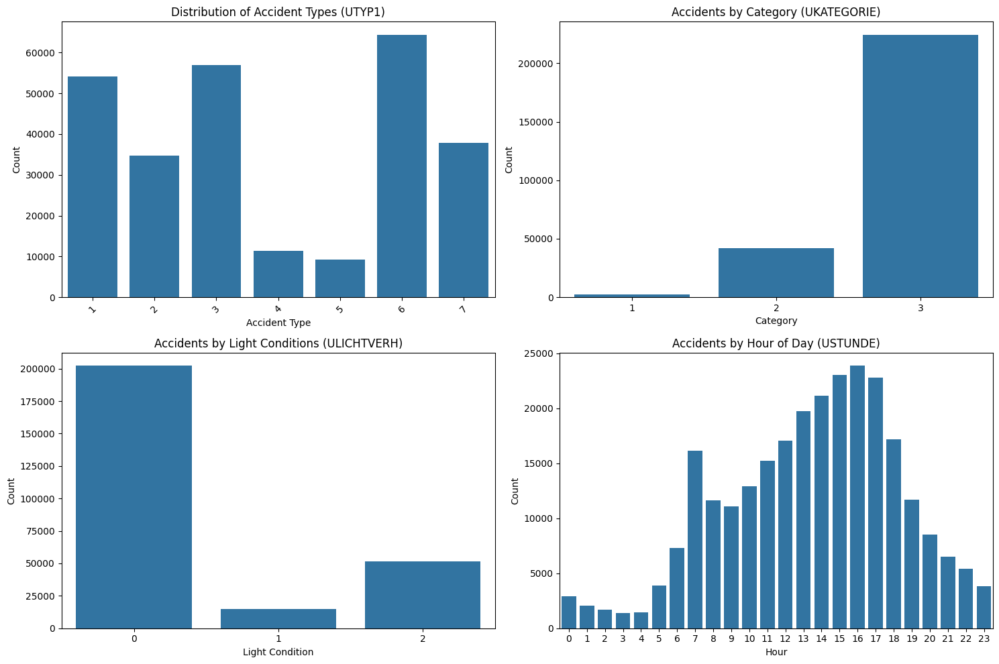

In [2]:
# Visualizations for German accident locations data (Unfallorte)
plt.figure(figsize=(15, 10))

# Plot 1: Accident Type Distribution (UTYP1)
plt.subplot(2, 2, 1)
accident_type_counts = accident_locations['UTYP1'].value_counts()
sns.barplot(x=accident_type_counts.index, y=accident_type_counts.values)
plt.title('Distribution of Accident Types (UTYP1)')
plt.xlabel('Accident Type')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Plot 2: Accident Category (UKATEGORIE)
plt.subplot(2, 2, 2)
cat_counts = accident_locations['UKATEGORIE'].value_counts().sort_index()
sns.barplot(x=cat_counts.index, y=cat_counts.values)
plt.title('Accidents by Category (UKATEGORIE)')
plt.xlabel('Category')
plt.ylabel('Count')

# Plot 3: Light Conditions (ULICHTVERH)
plt.subplot(2, 2, 3)
light_counts = accident_locations['ULICHTVERH'].value_counts().sort_index()
sns.barplot(x=light_counts.index, y=light_counts.values)
plt.title('Accidents by Light Conditions (ULICHTVERH)')
plt.xlabel('Light Condition')
plt.ylabel('Count')

# Plot 4: Hour of Day (USTUNDE)
plt.subplot(2, 2, 4)
hour_counts = accident_locations['USTUNDE'].value_counts().sort_index()
sns.barplot(x=hour_counts.index, y=hour_counts.values)
plt.title('Accidents by Hour of Day (USTUNDE)')
plt.xlabel('Hour')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

In [3]:
# Display the first few rows of each dataset to understand their structure
print("DFT Road Casualty Statistics - First few rows:")
print(dft_data.head())

print("\n" + "="*80 + "\n")

print("Accident Locations - First few rows:")
print(accident_locations.head())

DFT Road Casualty Statistics - First few rows:
  collision_index  collision_year collision_ref_no  location_easting_osgr  \
0   202417H103224            2024        17H103224                 448894   
1   202417M217924            2024        17M217924                 452135   
2   202417S204524            2024        17S204524                 445427   
3   2024481510889            2024        481510889                 533587   
4   2024481563500            2024        481563500                 532676   

   location_northing_osgr  longitude  latitude  police_force  \
0                  532505   -1.24312  54.68523            17   
1                  519436   -1.19517  54.56747            17   
2                  522924   -1.29837  54.59946            17   
3                  181174   -0.07626  51.51371            48   
4                  180902   -0.08948  51.51148            48   

   collision_severity  number_of_vehicles  number_of_casualties        date  \
0                   3     

In [4]:
# Display column names for both datasets
print("DFT Road Casualty Statistics columns:")
print(dft_data.columns.tolist())
print("\nAccident Locations columns:")
print(accident_locations.columns.tolist())

DFT Road Casualty Statistics columns:
['collision_index', 'collision_year', 'collision_ref_no', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'collision_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'local_authority_highway_current', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail_historic', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control_historic', 'pedestrian_crossing_physical_facilities_historic', 'pedestrian_crossing', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards_historic', 'carriageway_hazards', 'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'lsoa_of_accident_location', 'enhanced_severity_

## 3. DFT Road Casualty Statistics Analysis

Let's analyze the road casualty statistics data first:

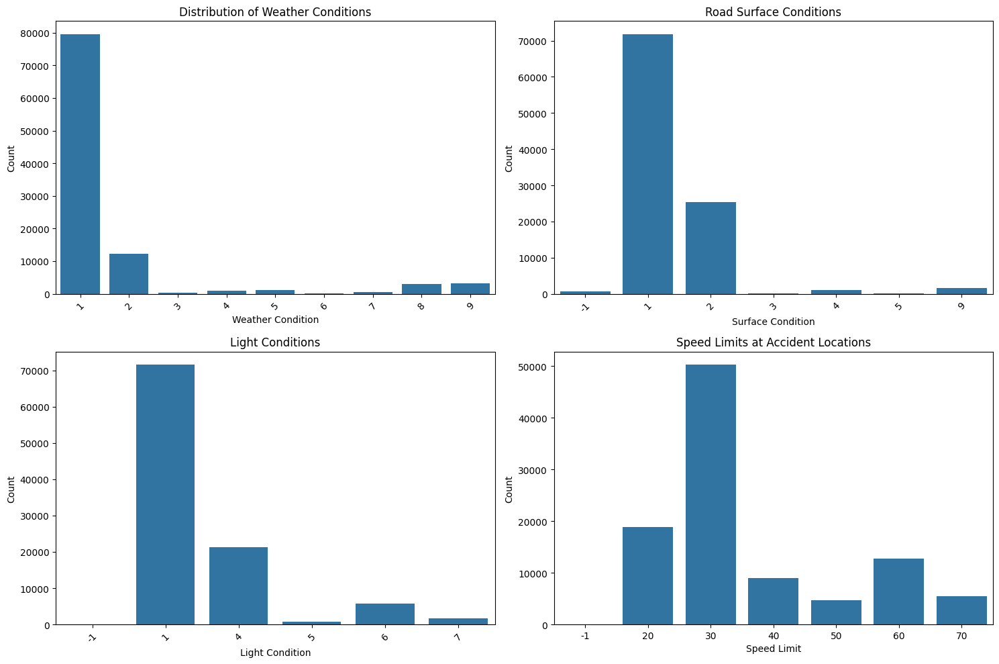

In [5]:
# Visualizations for UK DFT data
plt.figure(figsize=(15, 10))

# Plot 1: Weather Conditions
plt.subplot(2, 2, 1)
weather_counts = dft_data['weather_conditions'].value_counts()
sns.barplot(x=weather_counts.index, y=weather_counts.values)
plt.title('Distribution of Weather Conditions')
plt.xlabel('Weather Condition')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Plot 2: Road Surface Conditions
plt.subplot(2, 2, 2)
surface_counts = dft_data['road_surface_conditions'].value_counts()
sns.barplot(x=surface_counts.index, y=surface_counts.values)
plt.title('Road Surface Conditions')
plt.xlabel('Surface Condition')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Plot 3: Light Conditions
plt.subplot(2, 2, 3)
light_counts = dft_data['light_conditions'].value_counts()
sns.barplot(x=light_counts.index, y=light_counts.values)
plt.title('Light Conditions')
plt.xlabel('Light Condition')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Plot 4: Speed Limit
plt.subplot(2, 2, 4)
speed_counts = dft_data['speed_limit'].value_counts().sort_index()
sns.barplot(x=speed_counts.index, y=speed_counts.values)
plt.title('Speed Limits at Accident Locations')
plt.xlabel('Speed Limit')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

## 4. Accident Locations Analysis

Let's analyze the German accident locations data (Unfallorte):

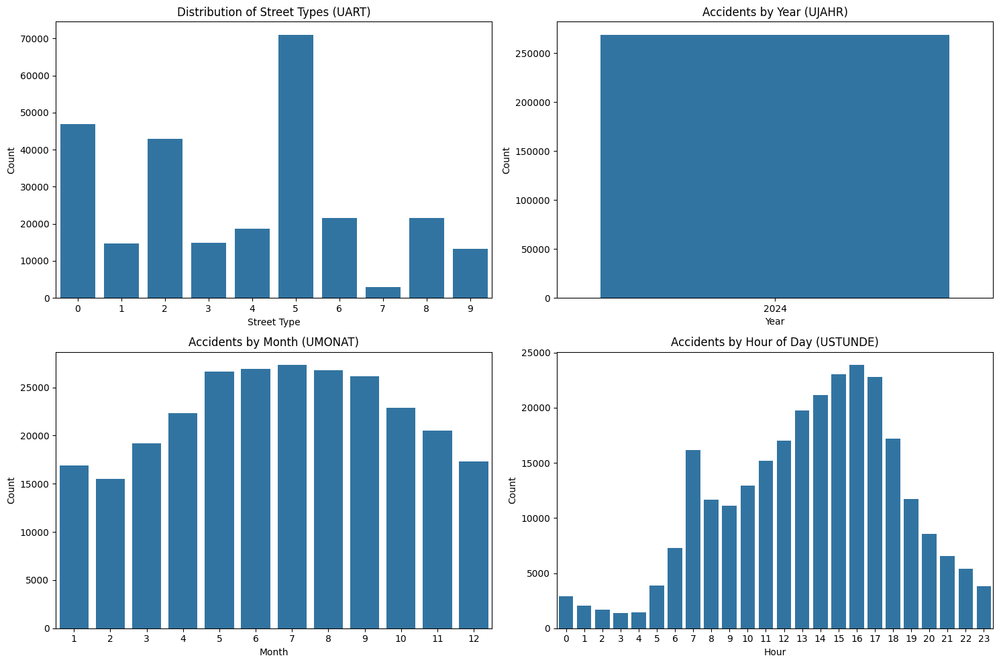

C:\Users\HP\AppData\Local\Temp\ipykernel_17148\1166960012.py:57: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


In [6]:
# More German accident locations analysis
plt.figure(figsize=(15, 10))

# Plot 1: Street Type (UART)
plt.subplot(2, 2, 1)
street_type_counts = accident_locations['UART'].value_counts()
sns.barplot(x=street_type_counts.index, y=street_type_counts.values)
plt.title('Distribution of Street Types (UART)')
plt.xlabel('Street Type')
plt.ylabel('Count')

# Plot 2: Year (UJAHR)
plt.subplot(2, 2, 2)
year_counts = accident_locations['UJAHR'].value_counts().sort_index()
sns.barplot(x=year_counts.index, y=year_counts.values)
plt.title('Accidents by Year (UJAHR)')
plt.xlabel('Year')
plt.ylabel('Count')

# Plot 3: Month (UMONAT)
plt.subplot(2, 2, 3)
month_counts = accident_locations['UMONAT'].value_counts().sort_index()
sns.barplot(x=month_counts.index, y=month_counts.values)
plt.title('Accidents by Month (UMONAT)')
plt.xlabel('Month')
plt.ylabel('Count')

# Plot 4: Hour (USTUNDE)
plt.subplot(2, 2, 4)
hour_counts = accident_locations['USTUNDE'].value_counts().sort_index()
sns.barplot(x=hour_counts.index, y=hour_counts.values)
plt.title('Accidents by Hour of Day (USTUNDE)')
plt.xlabel('Hour')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

# Map visualization using plotly (if coordinates are present)
if 'YGCSWGS84' in accident_locations.columns and 'XGCSWGS84' in accident_locations.columns:
    # Convert coordinates to float robustly (handle comma and dot, skip if already float)
    def to_float(val):
        try:
            if isinstance(val, str):
                return float(val.replace(',', '.'))
            return float(val)
        except Exception:
            return np.nan
    # Only convert if dtype is not float already
    if not np.issubdtype(accident_locations['YGCSWGS84'].dtype, np.floating):
        accident_locations['YGCSWGS84'] = accident_locations['YGCSWGS84'].apply(to_float)
    if not np.issubdtype(accident_locations['XGCSWGS84'].dtype, np.floating):
        accident_locations['XGCSWGS84'] = accident_locations['XGCSWGS84'].apply(to_float)
    # Drop rows with missing coordinates
    coords_ok = accident_locations[['YGCSWGS84', 'XGCSWGS84']].dropna()
    if not coords_ok.empty:
        fig = px.scatter_mapbox(
            accident_locations.loc[coords_ok.index],
            lat='YGCSWGS84',
            lon='XGCSWGS84',
            hover_data=['USTUNDE', 'UMONAT', 'UJAHR', 'UART'],
            color='UKATEGORIE',
            zoom=5,
            title='Accident Locations Map (Germany)'
        )
        fig.update_layout(mapbox_style='open-street-map')
        fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0})
        fig.show()
    else:
        print('No valid coordinates available for mapping.')

In [7]:
# Let's look at the actual columns in the accident_locations dataset
print("Columns in accident_locations dataset:")
print(accident_locations.columns.tolist())

Columns in accident_locations dataset:
['OID_', 'UIDENTSTLAE', 'ULAND', 'UREGBEZ', 'UKREIS', 'UGEMEINDE', 'UJAHR', 'UMONAT', 'USTUNDE', 'UWOCHENTAG', 'UKATEGORIE', 'UART', 'UTYP1', 'ULICHTVERH', 'IstStrassenzustand', 'IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz', 'IstSonstige', 'LINREFX', 'LINREFY', 'XGCSWGS84', 'YGCSWGS84', 'PLST']


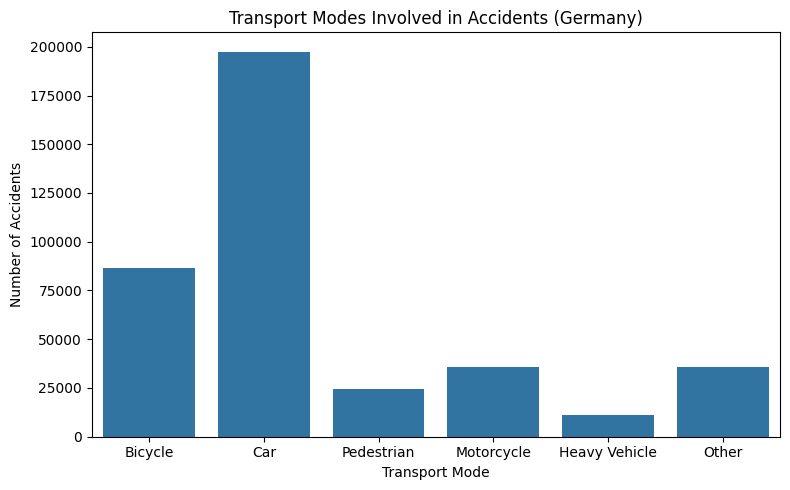

In [8]:
# Analyze involvement of different transport modes in German data
transport_cols = ['IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz', 'IstSonstige']
transport_labels = ['Bicycle', 'Car', 'Pedestrian', 'Motorcycle', 'Heavy Vehicle', 'Other']

# Convert to numeric (if needed)
for col in transport_cols:
    accident_locations[col] = pd.to_numeric(accident_locations[col], errors='coerce')

transport_counts = accident_locations[transport_cols].sum()

plt.figure(figsize=(8, 5))
sns.barplot(x=transport_labels, y=transport_counts.values)
plt.title('Transport Modes Involved in Accidents (Germany)')
plt.xlabel('Transport Mode')
plt.ylabel('Number of Accidents')
plt.tight_layout()
plt.show()

In [9]:
# Display information about the accident_locations dataset
print("Data Types:")
print(accident_locations.dtypes)
print("\nFirst few rows:")
print(accident_locations.head())

Data Types:
OID_                    int64
UIDENTSTLAE            object
ULAND                   int64
UREGBEZ                 int64
UKREIS                  int64
UGEMEINDE               int64
UJAHR                   int64
UMONAT                  int64
USTUNDE                 int64
UWOCHENTAG              int64
UKATEGORIE              int64
UART                    int64
UTYP1                   int64
ULICHTVERH              int64
IstStrassenzustand      int64
IstRad                  int64
IstPKW                  int64
IstFuss                 int64
IstKrad                 int64
IstGkfz                 int64
IstSonstige             int64
LINREFX                object
LINREFY                object
XGCSWGS84             float64
YGCSWGS84             float64
PLST                    int64
dtype: object

First few rows:
   OID_          UIDENTSTLAE  ULAND  UREGBEZ  UKREIS  UGEMEINDE  UJAHR  \
0     1  1240526125013102024      1        0      59         44   2024   
1     2  1240526105132502024 

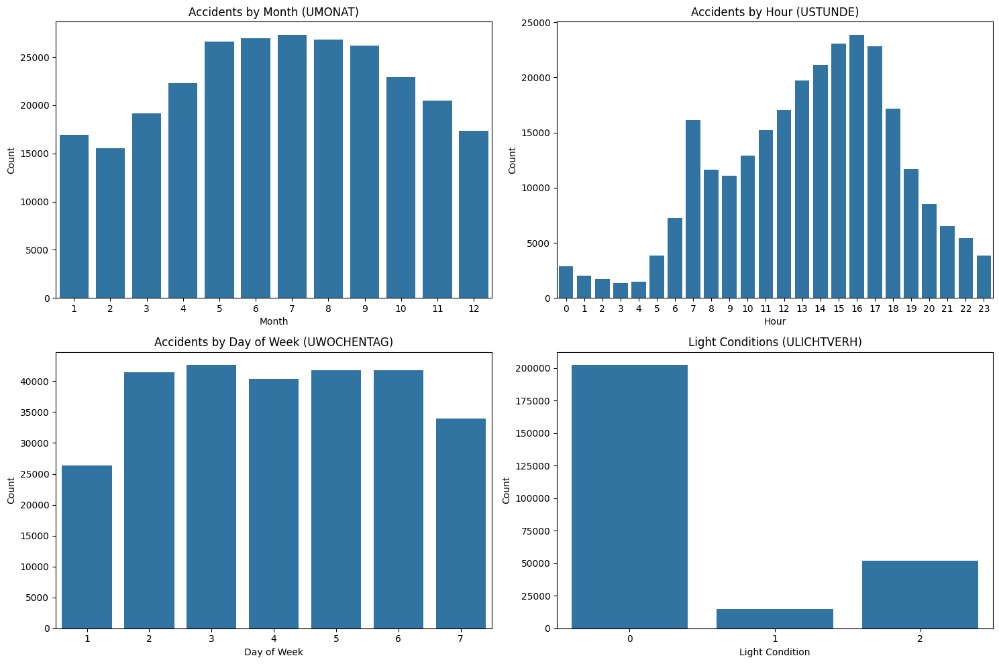

C:\Users\HP\AppData\Local\Temp\ipykernel_17148\3015896064.py:42: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [10]:
# Additional time-based and light condition analysis for German data
plt.figure(figsize=(15, 10))

# Plot 1: Month Distribution
plt.subplot(2, 2, 1)
month_counts = accident_locations['UMONAT'].value_counts().sort_index()
sns.barplot(x=month_counts.index, y=month_counts.values)
plt.title('Accidents by Month (UMONAT)')
plt.xlabel('Month')
plt.ylabel('Count')

# Plot 2: Hour Distribution
plt.subplot(2, 2, 2)
hour_counts = accident_locations['USTUNDE'].value_counts().sort_index()
sns.barplot(x=hour_counts.index, y=hour_counts.values)
plt.title('Accidents by Hour (USTUNDE)')
plt.xlabel('Hour')
plt.ylabel('Count')

# Plot 3: Day of Week Distribution
plt.subplot(2, 2, 3)
day_counts = accident_locations['UWOCHENTAG'].value_counts().sort_index()
sns.barplot(x=day_counts.index, y=day_counts.values)
plt.title('Accidents by Day of Week (UWOCHENTAG)')
plt.xlabel('Day of Week')
plt.ylabel('Count')

# Plot 4: Light Conditions
plt.subplot(2, 2, 4)
light_counts = accident_locations['ULICHTVERH'].value_counts().sort_index()
sns.barplot(x=light_counts.index, y=light_counts.values)
plt.title('Light Conditions (ULICHTVERH)')
plt.xlabel('Light Condition')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

# Map visualization using plotly (if coordinates are present)
if 'YGCSWGS84' in accident_locations.columns and 'XGCSWGS84' in accident_locations.columns:
    # Coordinates already converted in previous cell
    fig = px.scatter_mapbox(
        accident_locations,
        lat='YGCSWGS84',
        lon='XGCSWGS84',
        hover_data=['USTUNDE', 'UMONAT', 'UJAHR'],
        zoom=5,
        title='Accident Locations Map (Germany)')
    fig.update_layout(mapbox_style='open-street-map')
    fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0})
    fig.show()